In [1]:
import scanpy as sc
import muon as mu
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.n_jobs = 16
sc.set_figure_params(dpi=100,dpi_save=800, figsize=(5,5), frameon=False, format='eps')
%config InlineBackend.figure_format='retina'

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/

In [2]:
import scvelo as scv
import cellrank as cr
from cellrank.kernels import CytoTRACEKernel
from cellrank.estimators import GPCCA

# Apply estimators for each subtype

In [3]:
adata = sc.read_h5ad('./Results_h5ad/05_noci_adata_cellrank2_CytoTRACE_prep.h5ad')

In [ ]:
adata.obs['subPain'] = adata.obs['PainCon'].astype(str)
adata.obs.subPain[(adata.obs.PainCon == 'noPain') & (adata.obs.Time == '0day')] = 'noPain_t0'
adata.obs.subPain[(adata.obs.PainCon == 'noPain') & (adata.obs.Time.isin(['1.5day','2day','3day','7day','14day','28day']))] = 'noPain_tN'
adata.obs.subPain[(adata.obs.PainCon == 'Pain') & (adata.obs.Time.isin(['0.25day','1day','1.5day','2day','3day','7day','14day']))] = 'Pain'
adata.obs.subPain[(adata.obs.PainCon == 'Pain') & (adata.obs.Time == '28day')] = 'Stuck'
adata.obs.subPain[(adata.obs.subPain == 'noPain')] = 'Moving'

In [3]:
adata = adata[~adata.obs.Time.isin(['60day','90day'])].copy()

In [20]:
adata.obs.to_csv('./noci_obs_cellrank2_CytoTRACE_prep.csv')

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

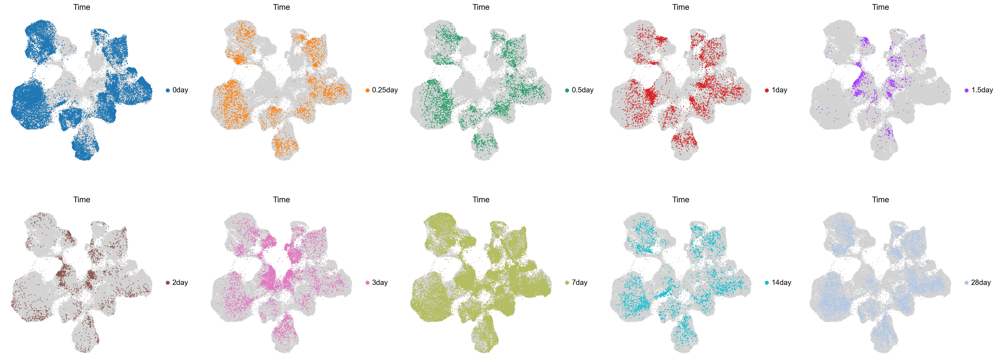

In [ ]:
fig, ax = plt.subplots(2,5,figsize=(25,10))
fig.tight_layout(pad=3)
ax = ax.ravel()
for i,g in enumerate(adata.obs.Time.cat.categories):
    sc.pl.umap(adata, color='Time', groups=g, size=10, show=False, ax=ax[i], na_in_legend=False).grid(False)
fig.savefig('/Users/pax/Manu_fig/umap_time_split.pdf')

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


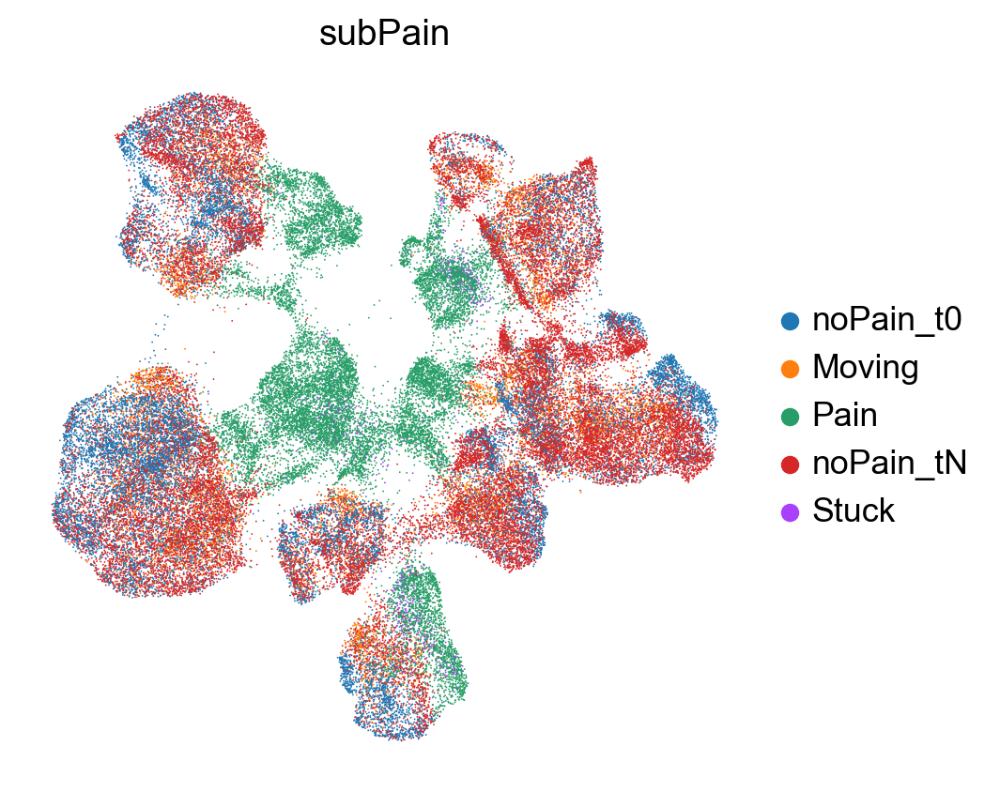

In [25]:
sc.pl.umap(adata, color='subPain')

In [ ]:
adata.obs['subPain'].cat.reorder_categories(['noPain_t0','Moving','Pain','noPain_tN','Stuck'], inplace=True)

In [ ]:
renam_dict = dict(zip(adata.obs['subPain'].cat.categories,['Reference','Moving','Pain','Recovery','Stuck']))

In [ ]:
adata.obs['Pain_dynamics'] = adata.obs['subPain'].map(renam_dict)

In [ ]:
del adata.uns['log1p']

In [12]:
sc.pp.highly_variable_genes(adata)

In [12]:
adata.X = adata.layers['scVI_gene'].copy()
sc.pp.log1p(adata)
adata.layers["spliced"] = adata.X
adata.layers["unspliced"] = adata.X

import scvelo as scv
# scv.pp.moments(adata, n_pcs=30, n_neighbors=30, use_rep="X_scVI")
sc.pp.neighbors(adata, n_neighbors=30, use_rep="X_scVI")
scv.pp.moments(adata, n_pcs=30, n_neighbors=30, use_rep="X_scVI")

computing moments based on connectivities
    finished (0:03:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [13]:
from cellrank.kernels import CytoTRACEKernel

# ctk = CytoTRACEKernel(adata).compute_cytotrace(aggregation='mean')
ctk = CytoTRACEKernel(adata)

In [14]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5, n_jobs=-1)

  0%|          | 0/70963 [00:00<?, ?cell/s]

CytoTRACEKernel[n=70963, dnorm=False, scheme='soft', b=10.0, nu=0.5]

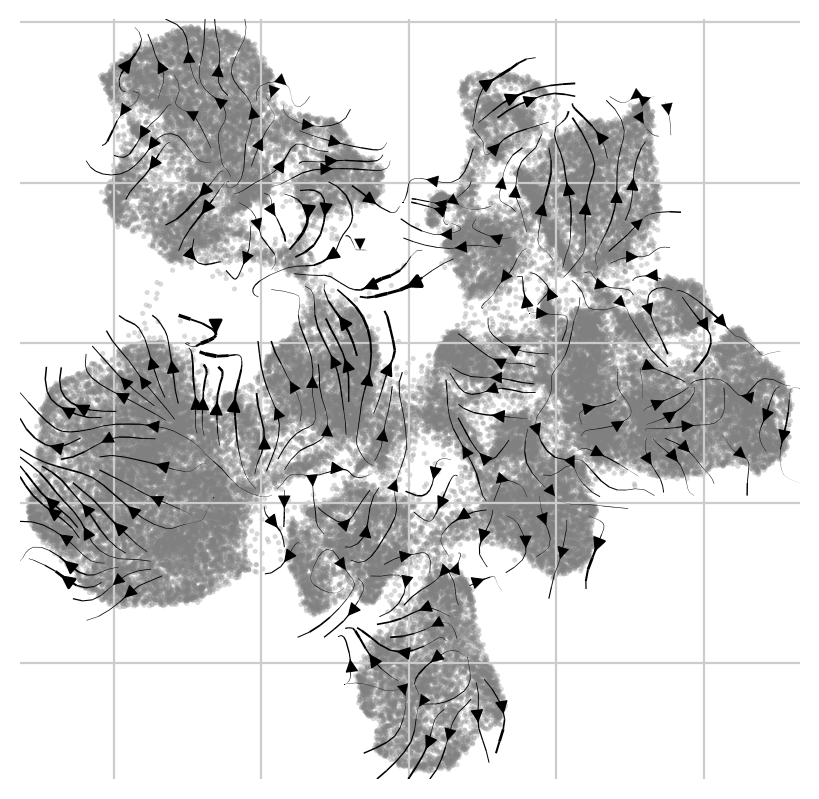

In [15]:
ctk.plot_projection(basis="umap", key_added='CT')

computing moments based on connectivities
    finished (0:00:46) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/18409 [00:00<?, ?cell/s]

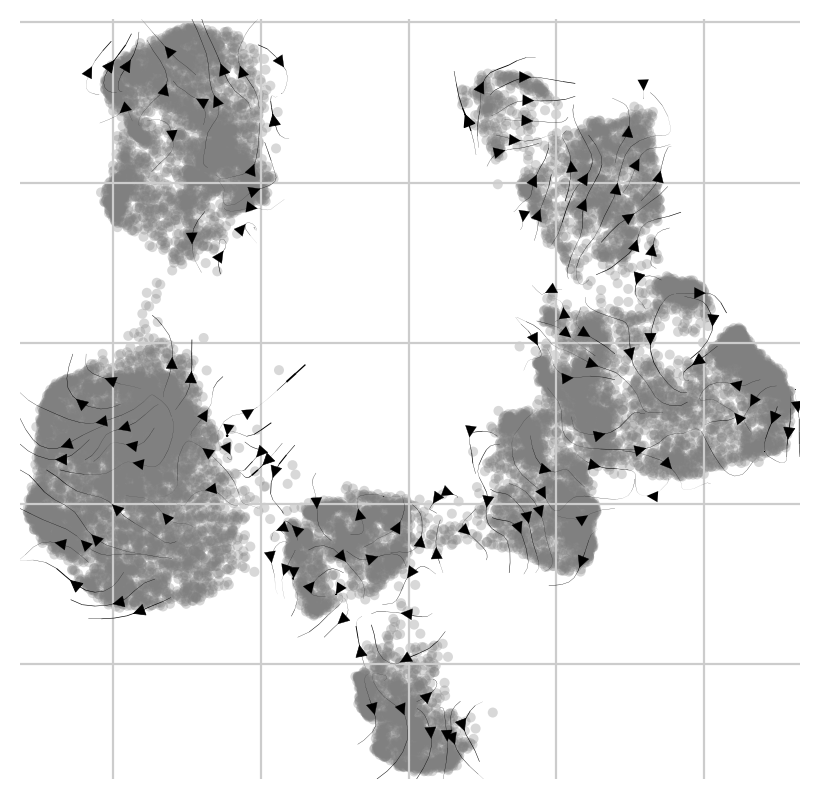

computing moments based on connectivities
    finished (0:00:20) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/7808 [00:00<?, ?cell/s]

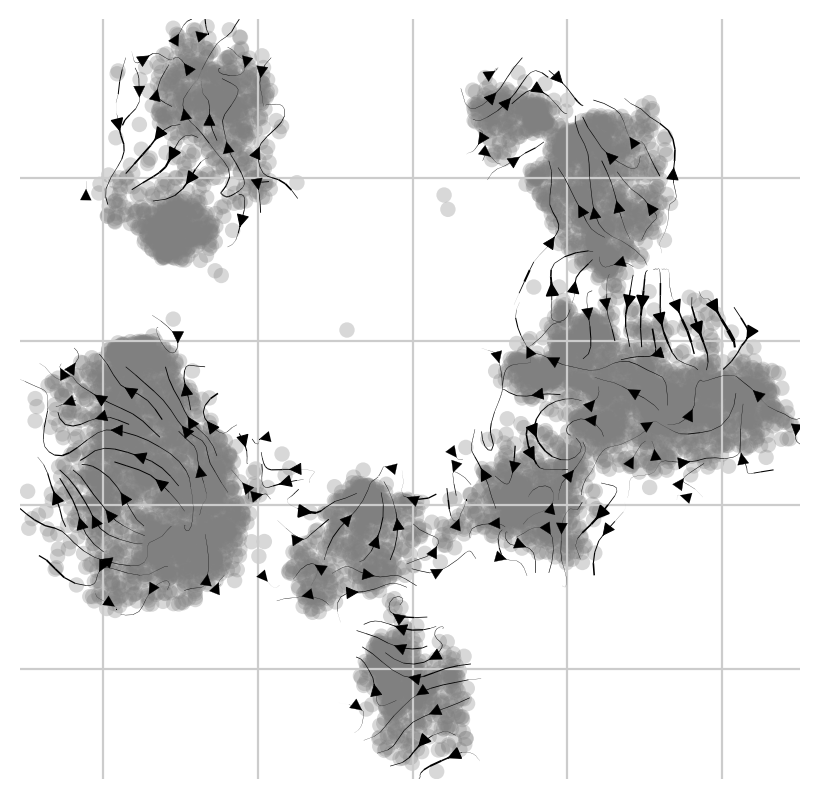

computing moments based on connectivities
    finished (0:00:41) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/15893 [00:00<?, ?cell/s]

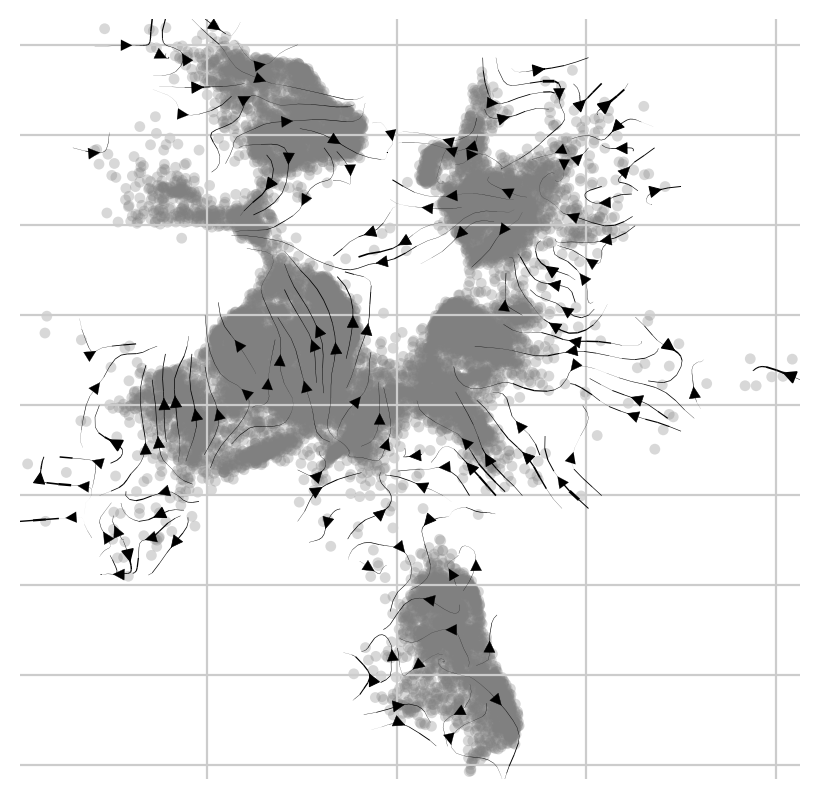

computing moments based on connectivities
    finished (0:01:13) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/28199 [00:00<?, ?cell/s]

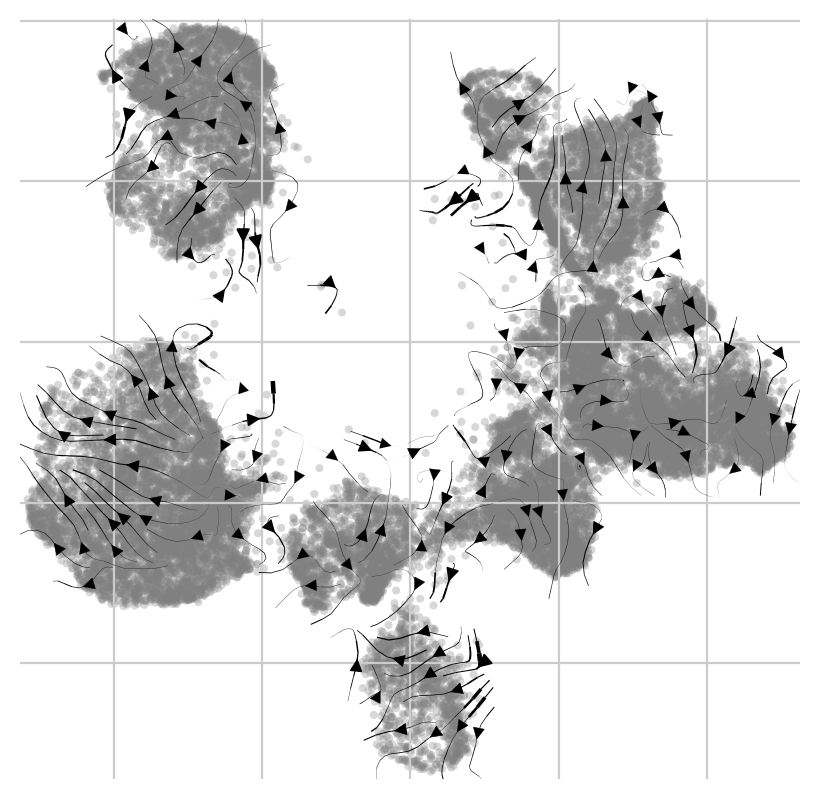

computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/654 [00:00<?, ?cell/s]

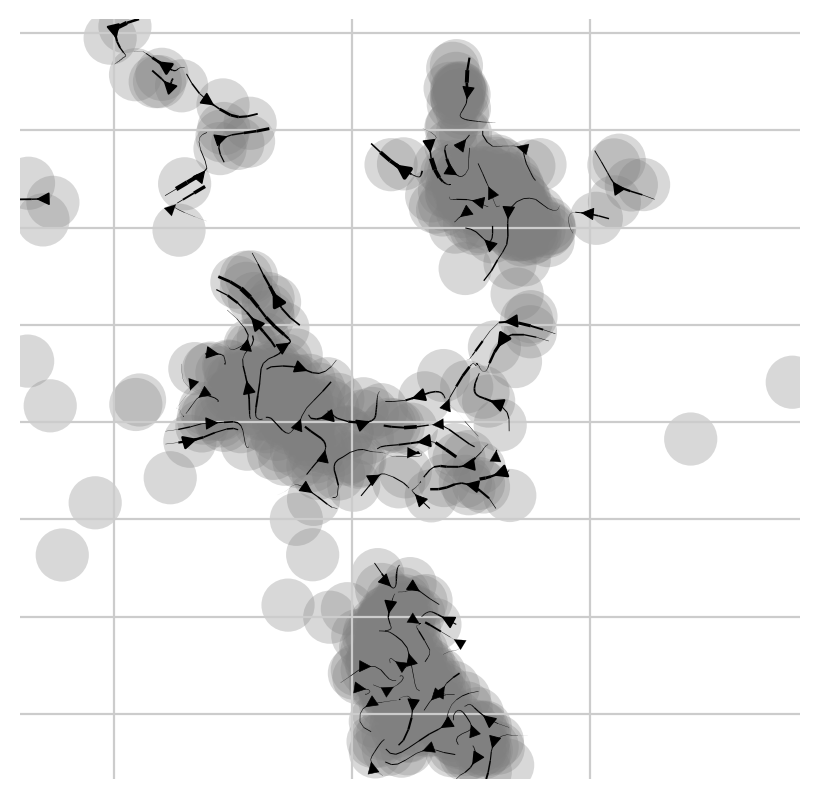

In [20]:
hold = {}
for i in adata.obs.Pain_dynamics.cat.categories:
    adata_ = adata[adata.obs.Pain_dynamics == i].copy()
    adata_.X = adata_.layers['scVI_gene'].copy()
    sc.pp.log1p(adata_)
    adata_.layers["spliced"] = adata_.X
    adata_.layers["unspliced"] = adata_.X

    import scvelo as scv
    # scv.pp.moments(adata_, n_pcs=30, n_neighbors=30, use_rep="X_scVI")
    sc.pp.neighbors(adata_, n_neighbors=30, use_rep="X_scVI")
    scv.pp.moments(adata_, n_pcs=30, n_neighbors=30, use_rep="X_scVI")
    from cellrank.kernels import CytoTRACEKernel

    # ctk = CytoTRACEKernel(adata_).compute_cytotrace(aggregation='mean')
    ctk = CytoTRACEKernel(adata_)
    ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5, n_jobs=-1)
    ctk.plot_projection(basis="umap", key_added='CT')
    hold[i] = adata_

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWa

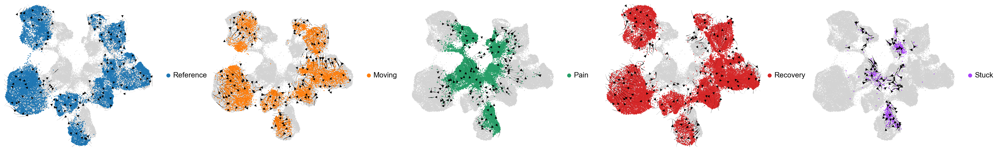

In [24]:
fig, ax = plt.subplots(1,5,figsize=(25,5))
fig.tight_layout(pad=3)
ax = ax.ravel()
for i,g in enumerate(adata.obs.Pain_dynamics.cat.categories):
    ax[i].grid(False)
    sc.pl.umap(adata, show=False, ax=ax[i], size=5).grid(False)
    sc.pl.umap(hold[g], color='Pain_dynamics', groups=g, size=10, show=False, ax=ax[i], na_in_legend=False)
    scv.pl.velocity_embedding_stream(hold[g], V=hold[g].obsm['CT_umap'], show=False, ax=ax[i], color='white')

fig.savefig('/Users/pax/Manu_fig/umap_velo_Pain_dynamics_stuck_all.svg')   

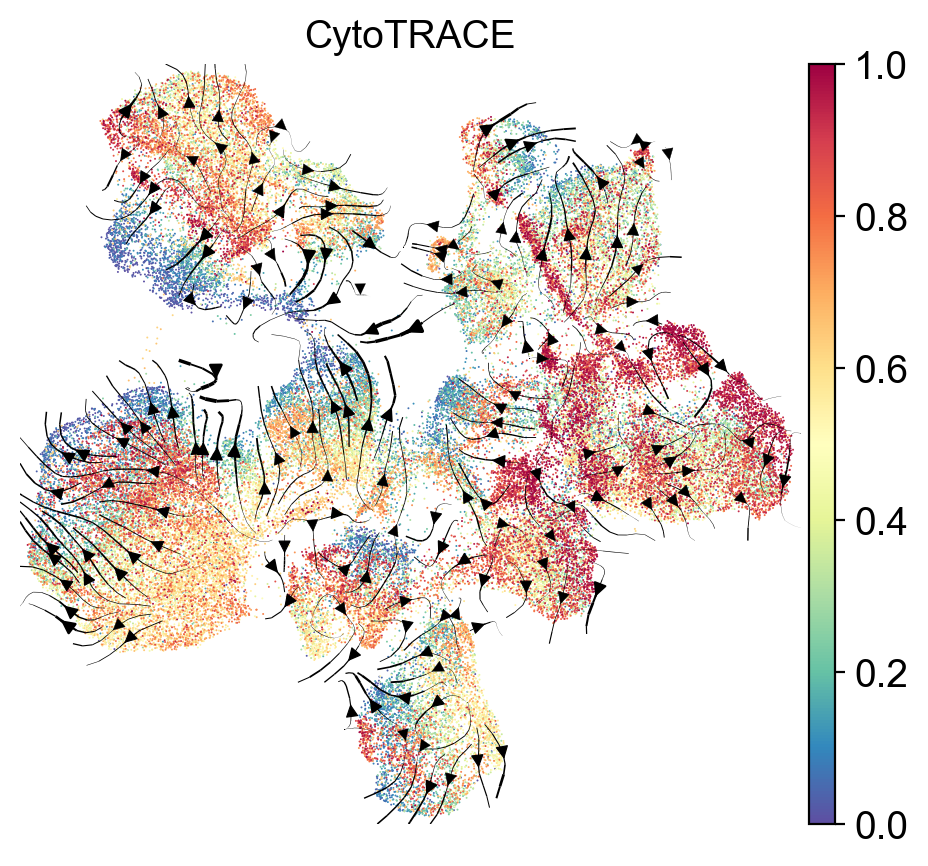

In [23]:
fig, ax = plt.subplots(figsize=(5.5,5))
scv.pl.velocity_embedding_stream(ctk.adata, V=adata.obsm['CT_umap'], show=False, ax=ax, color='white')
ax.grid(False)
sc.pl.umap(adata,color="ct_score",cmap="Spectral_r", size=2, ax=ax, title='CytoTRACE')

In [21]:
del adata.layers['magic']
del adata.layers['NB_counts']

In [22]:
adata.write_h5ad('./Results_h5ad/07_noci_adata_cellrank2_CytoTRACE_no60_90.h5ad')

In [2]:
adata = sc.read_h5ad('./Results_h5ad/07_noci_adata_cellrank2_CytoTRACE_no60_90.h5ad')

In [4]:
adata.obs['subtype_PainState'] = adata.obs['subtype'].astype(str) + '&' + adata.obs['PainCon'].astype(str)
adata.obs['subtype_subPain'] = adata.obs['subtype'].astype(str) + '&' + adata.obs['subPain'].astype(str)
adata.obs['subtype_Paindynamics'] = adata.obs['subtype'].astype(str) + '&' + adata.obs['Pain_dynamics'].astype(str)

In [5]:
import gseapy as gp
go_mf = gp.get_library(name='GO_Molecular_Function_2023', organism='Mouse')
hold = [k for k in go_mf.keys() if 'Voltage-Gated' in k or 'Monoatomic Ion' in k]
channels = list(set([j for i in hold for j in go_mf[i]]))
channels = pd.Series(channels).str.title().to_list()

In [6]:
del adata.uns['log1p']
sc.tl.rank_genes_groups(adata, groupby='subtype_Paindynamics', method='t-test_overestim_var', use_raw=False, layer='scVI_gene')

In [7]:
dyna_df = sc.get.rank_genes_groups_df(adata, group=None, log2fc_min=0, pval_cutoff=0.05)

In [8]:
dyna_df[['subtype','dynamics']] = dyna_df.group.str.split('&', expand=True)

In [11]:
dyna_df.to_excel('Results_xlsx/07_subtype_Pain_dynamics.xlsx')

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


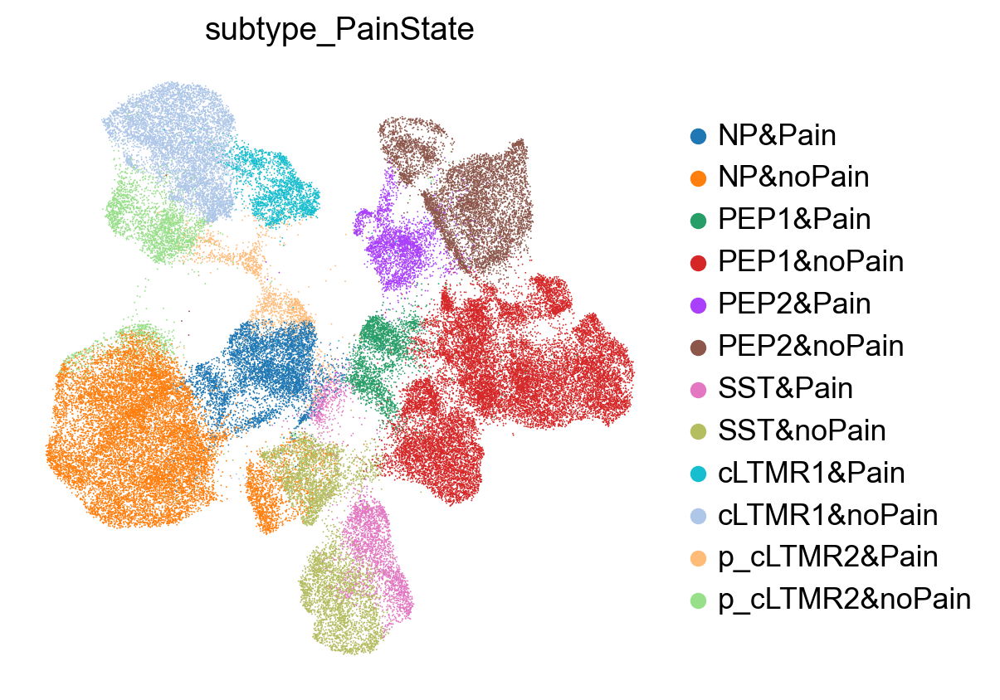

In [6]:
sc.pl.umap(adata, color=['subtype_PainState'])

In [16]:
import scFates as scf
ad_holder = {}

for sub in adata.obs.subtype.cat.categories:
    print(sub)
    ad_holder[sub] = {}
    ad_holder[sub]['adata'] = adata[adata.obs.subtype == sub].copy()
    scf.pp.batch_correct(ad_holder[sub]['adata'], depth_scale=1e4, batch_key='Source', layer='NB_counts')
    # sc.pp.normalize_total(ad_holder[sub]['adata'])
    sc.pp.log1p(ad_holder[sub]['adata'])
    sc.pp.highly_variable_genes(ad_holder[sub]['adata'])
    ad_holder[sub]['adata'].layers["spliced"] = ad_holder[sub]['adata'].X
    ad_holder[sub]['adata'].layers["unspliced"] = ad_holder[sub]['adata'].X
    sc.pp.neighbors(ad_holder[sub]['adata'], use_rep='X_scVI', n_neighbors=50, metric='correlation')
    scv.pp.moments(ad_holder[sub]['adata'], n_pcs=30, n_neighbors=30)
    ctk_ = CytoTRACEKernel(ad_holder[sub]['adata']).compute_cytotrace(aggregation='mean')
    ctk_.compute_transition_matrix(threshold_scheme="soft", nu=0.5, n_jobs=-1)
    g = GPCCA(ctk_)
    g.fit(n_states=3, cluster_key="PainState")
    g.predict_terminal_states(method="stability")
    g.compute_fate_probabilities()
    if "Pain_1" in ad_holder[sub]['adata'].obs.term_states_fwd.unique():
        if sub == 'NP':
            lin = 'Pain_1'
        elif sub == 'PEP1':
            lin = 'Pain_3'
        else:
            lin = 'Pain_2'
        ad_holder[sub]['drivers'] = g.compute_lineage_drivers(lineages=lin)
        ad_holder[sub]['gam'] = cr.models.GAMR(ad_holder[sub]['adata']).prepare(gene='Sox11', use_raw=False,
                                                                            time_key='ct_pseudotime', lineage=lin).fit()
    else:
        ad_holder[sub]['drivers'] = g.compute_lineage_drivers(lineages="Pain")
        ad_holder[sub]['gam'] = cr.models.GAMR(ad_holder[sub]['adata']).prepare(gene='Sox11', use_raw=False,
                                                                            time_key='ct_pseudotime', lineage="Pain").fit()
    ad_holder[sub]['kernel'] = ctk_
    ad_holder[sub]['GPCCA'] = g

NP
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:04) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:19) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/20051 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

PEP1
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:04) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:18) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/21062 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

PEP2
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:01) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:07) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/9034 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

SST
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:01) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:06) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/8060 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

cLTMR1
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:01) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:07) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/8407 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

p_cLTMR2
Performing pagoda2 batch correction
    depth scaling
    finished (0:00:00) --> updated 
    .layer['NB_counts'], batch corrected matrix.
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


  0%|          | 0/4349 [00:00<?, ?cell/s]

  0%|          | 0/3 [00:00<?, ?/s]

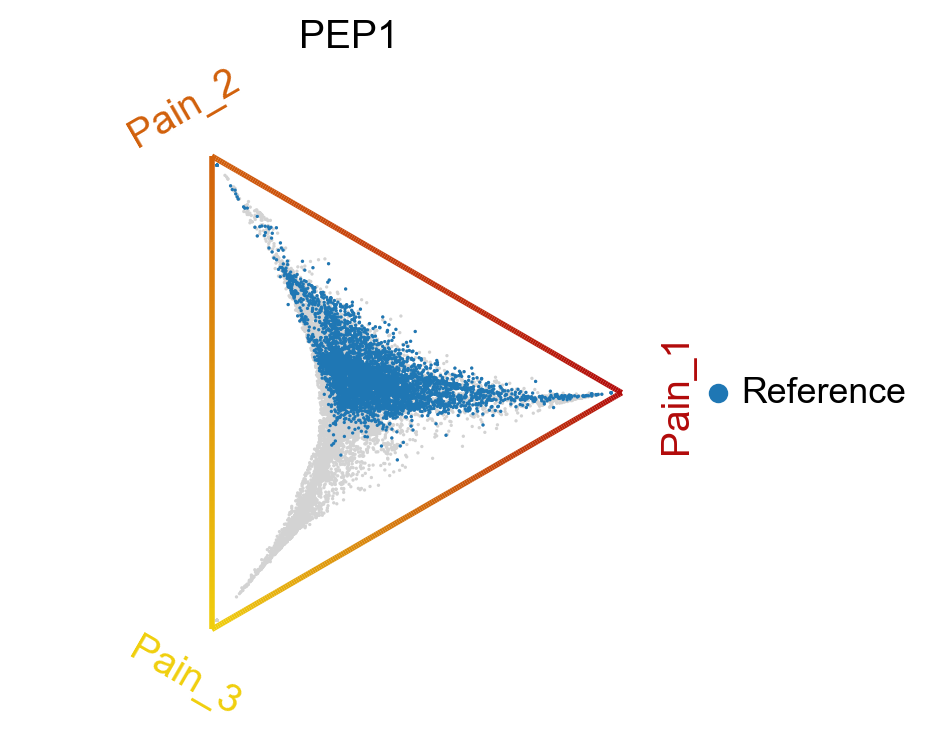

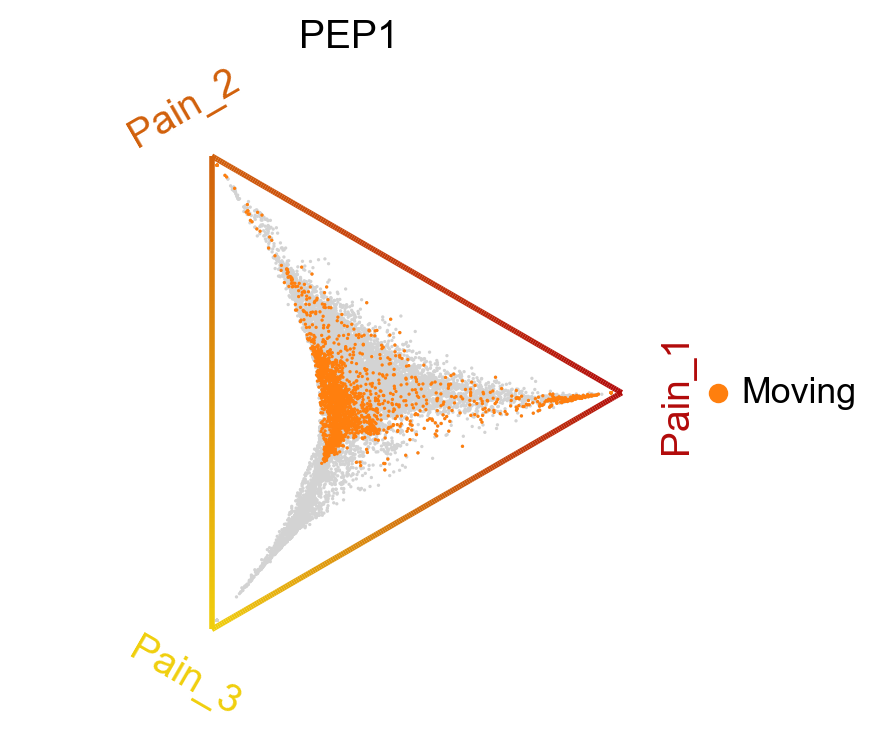

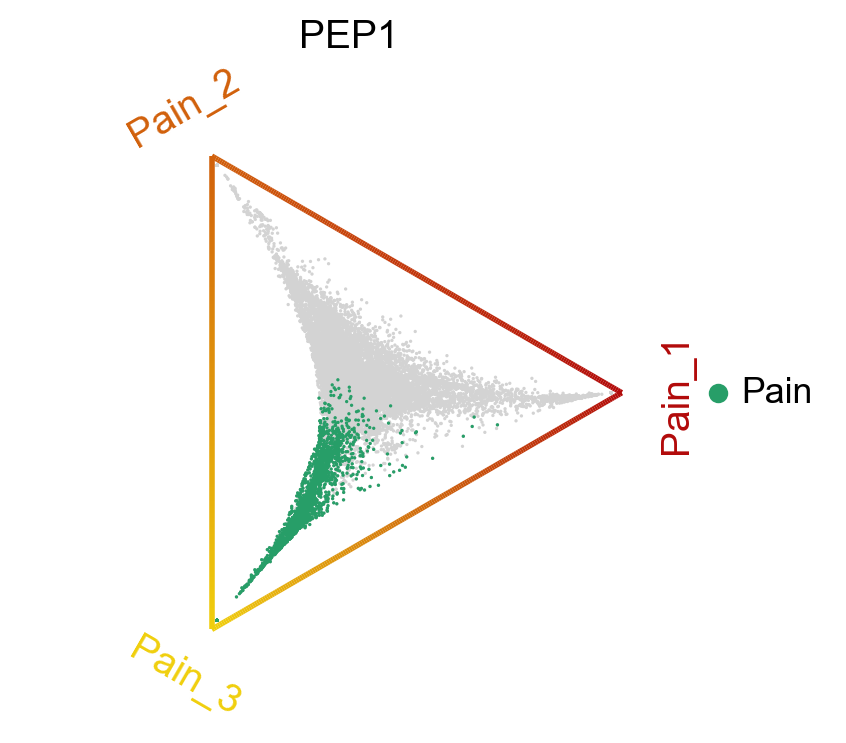

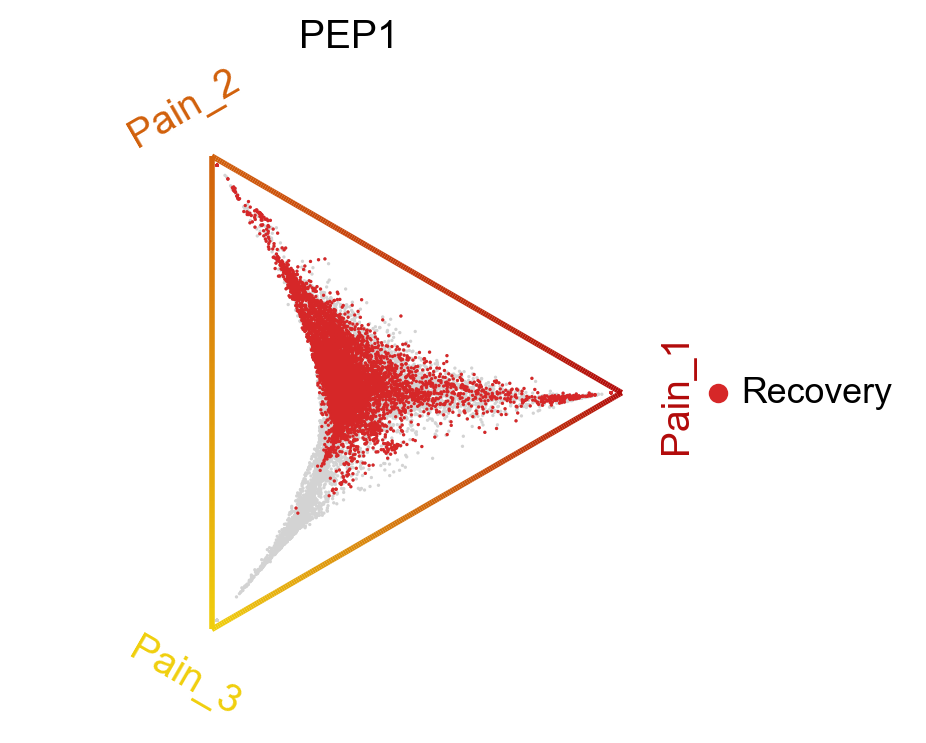

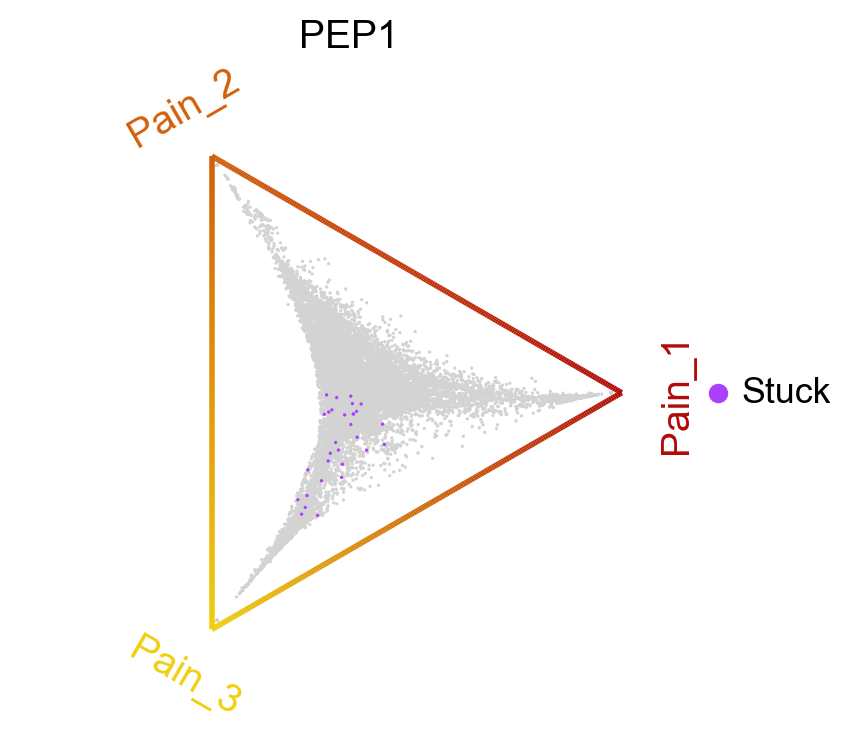

In [4]:
for key in ad_holder['PEP1']['adata'].obs.Pain_dynamics.cat.categories:
    cr.pl.circular_projection(ad_holder['PEP1']['adata'], keys="Pain_dynamics", groups=key, legend_loc="right", title='PEP1',
                              save=f'/Users/pax/Manu_fig/eps/PEP1_{key}_circular_projection.eps')

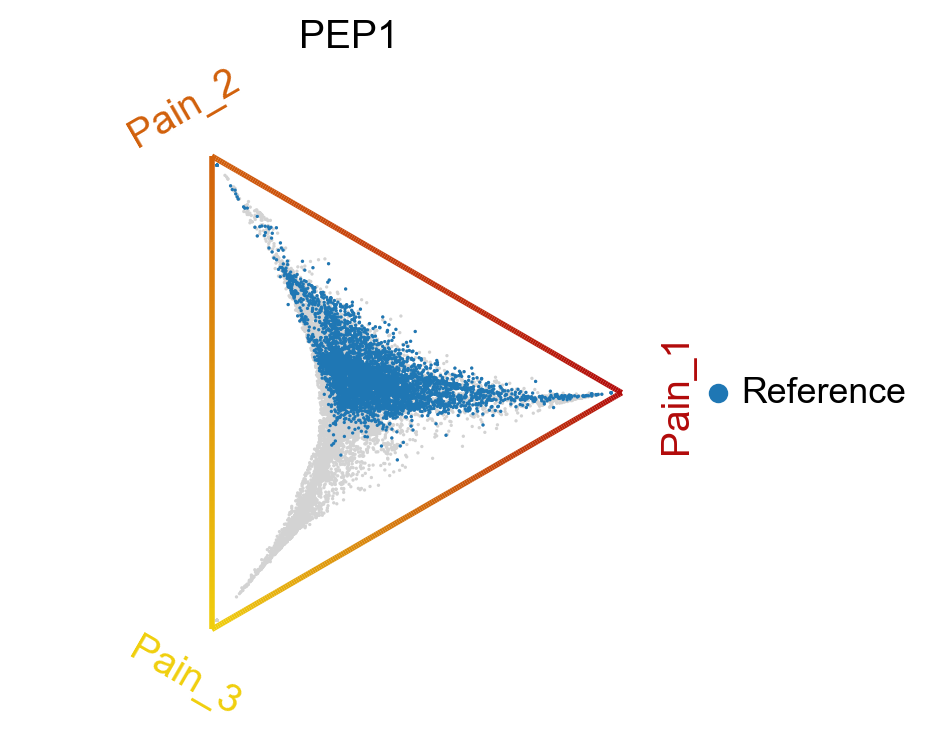

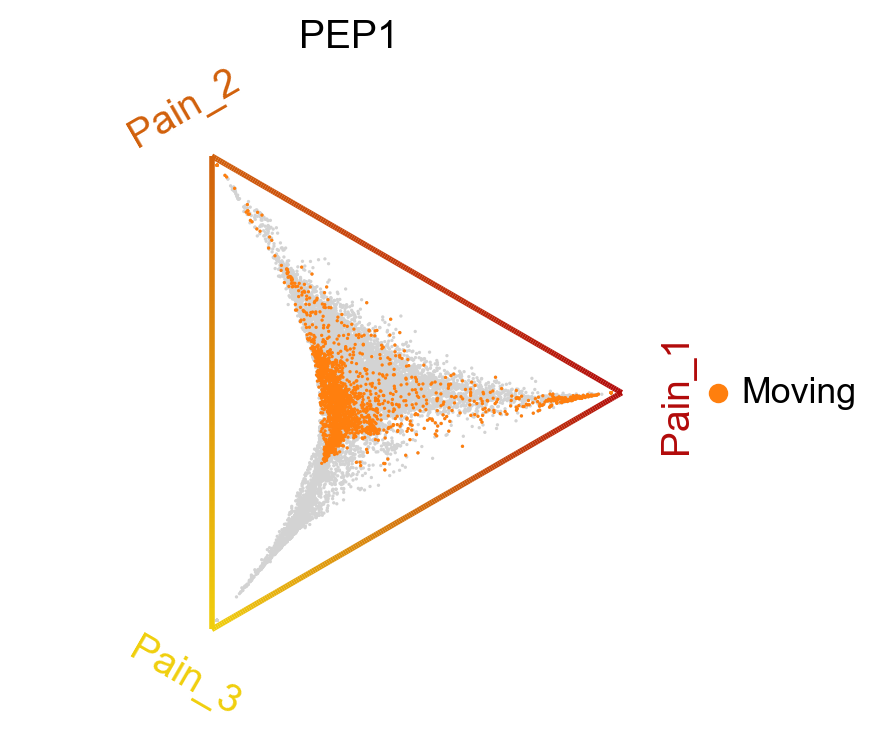

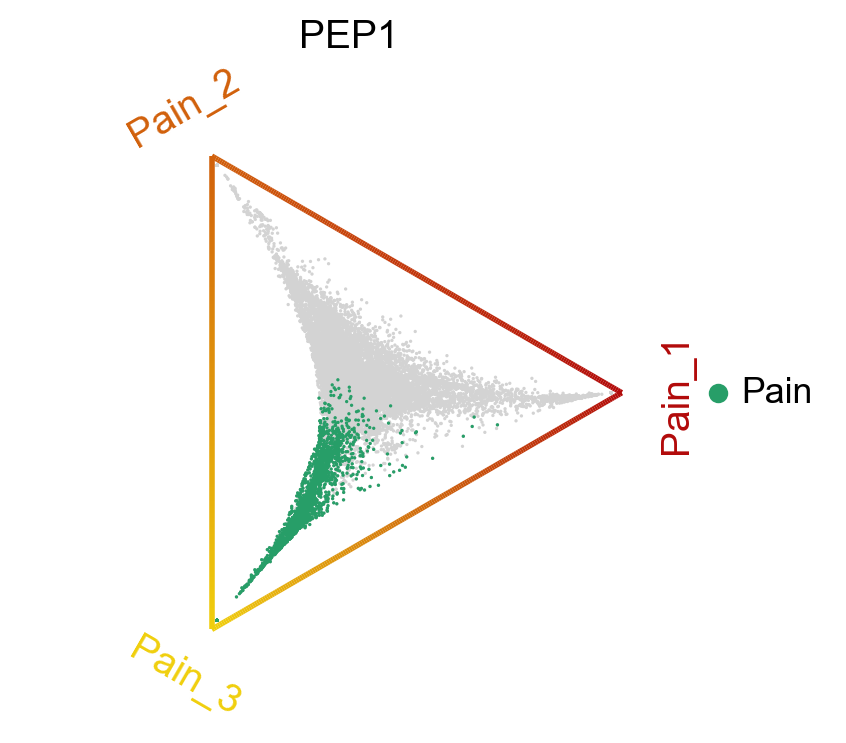

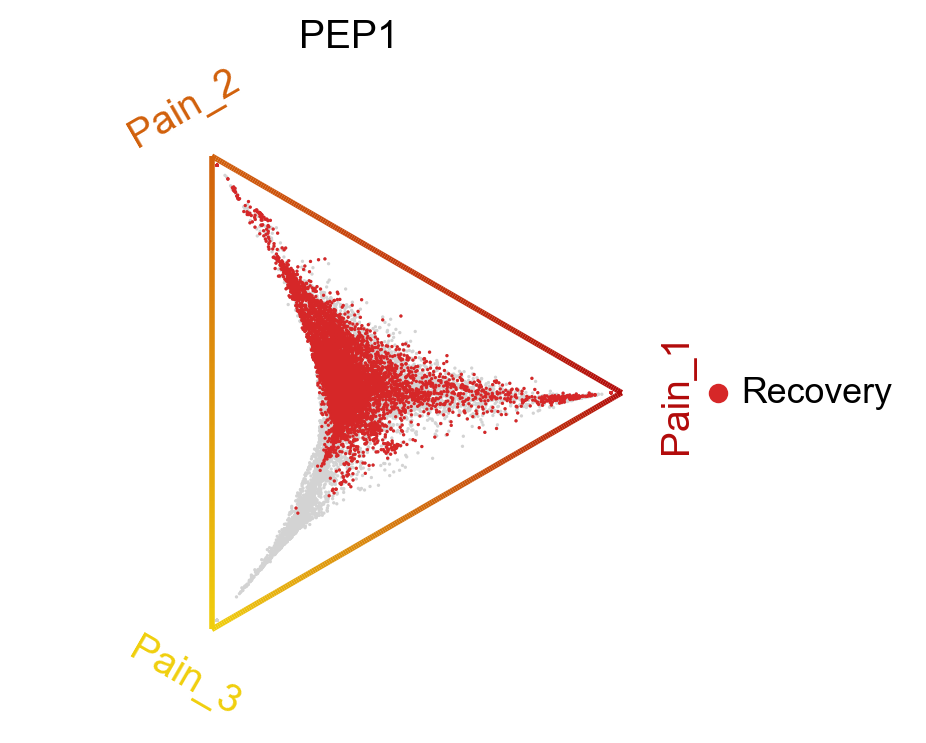

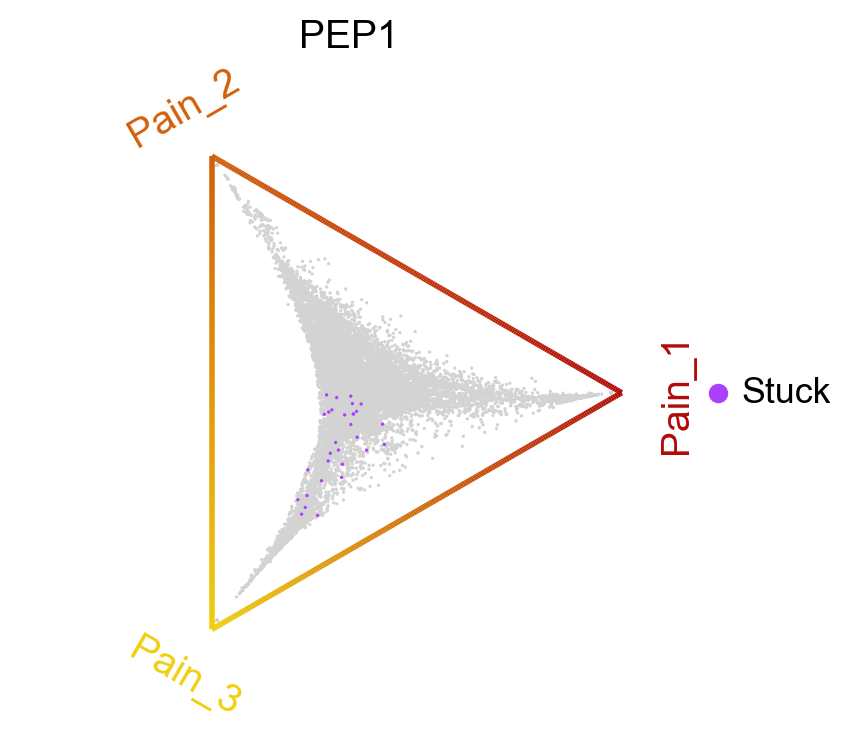

In [6]:
for key in ad_holder['PEP1']['adata'].obs.Pain_dynamics.cat.categories:
    cr.pl.circular_projection(ad_holder['PEP1']['adata'], keys="Pain_dynamics", groups=key, legend_loc="right", title='PEP1',
                              save=f'/Users/pax/Manu_fig/PEP1_{key}_circular_projection.pdf')

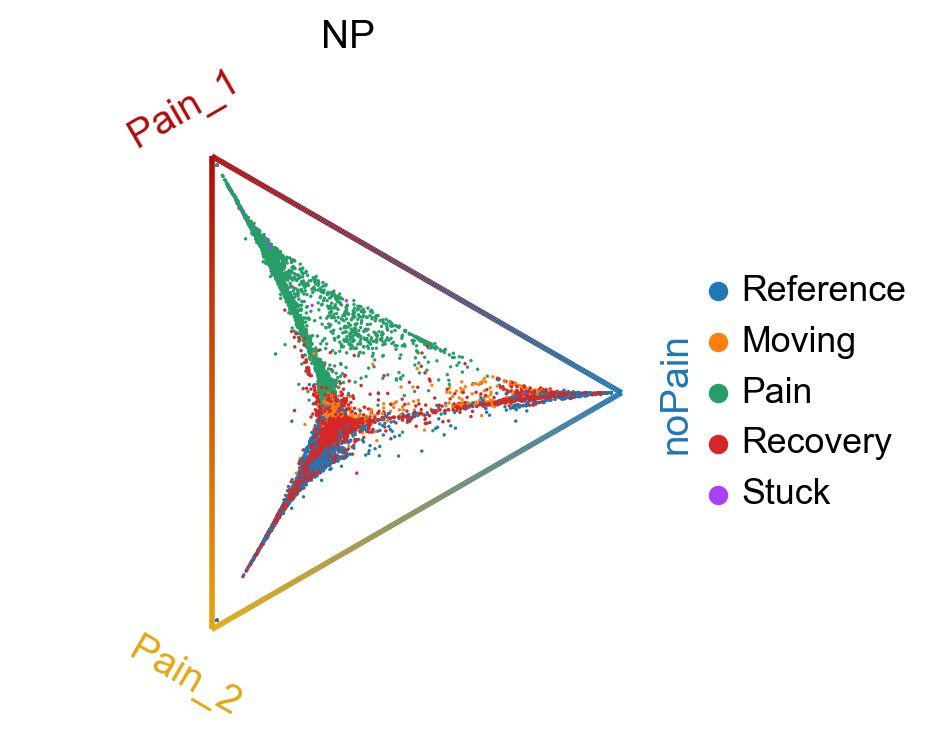

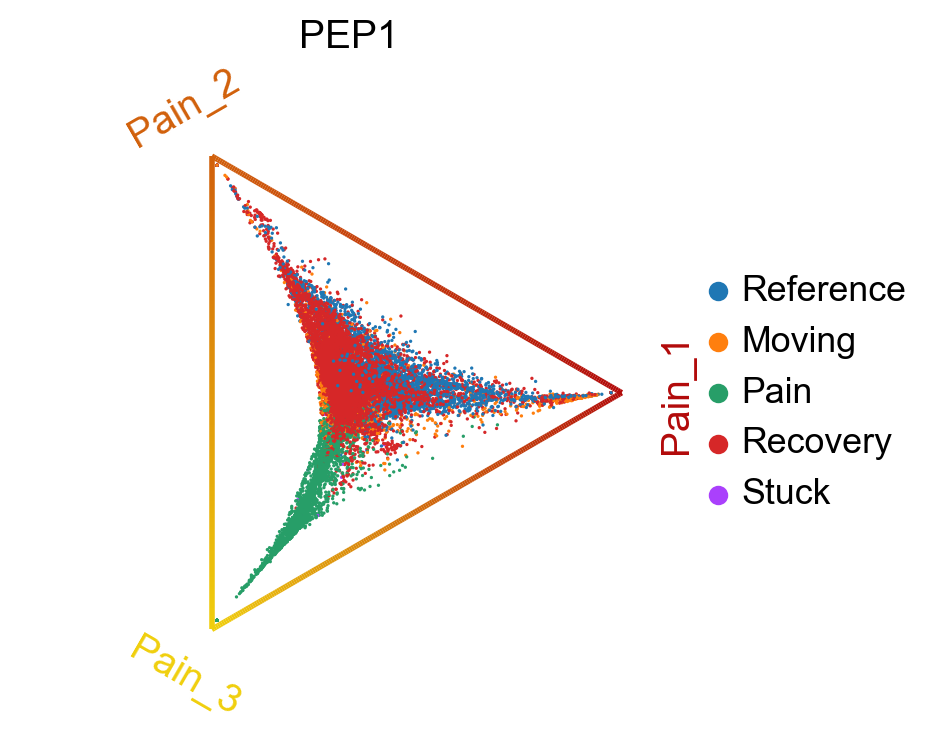

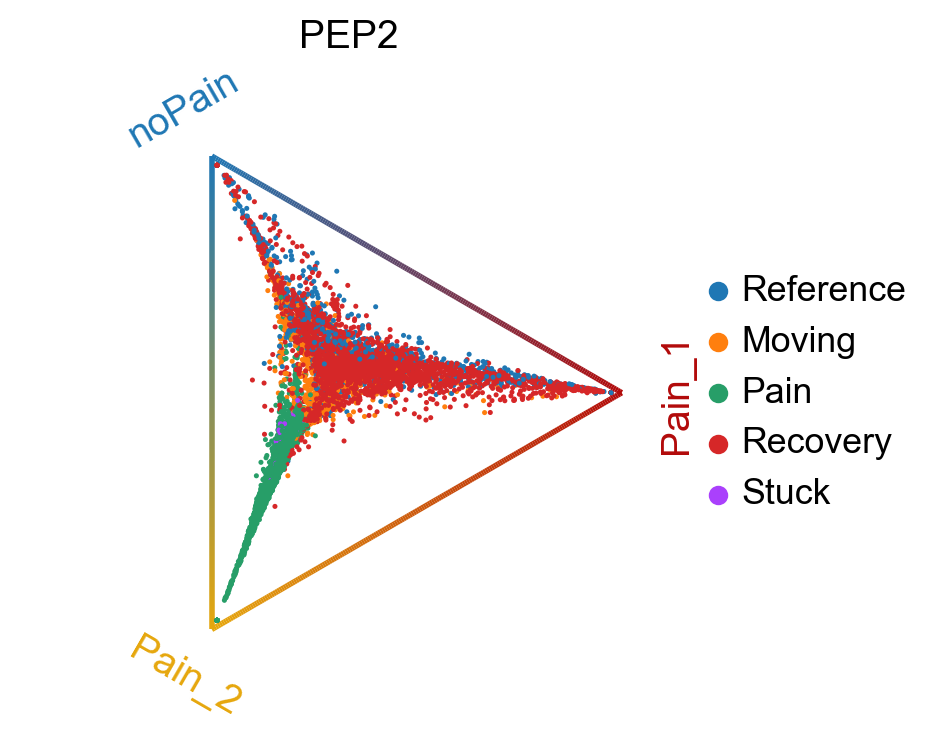

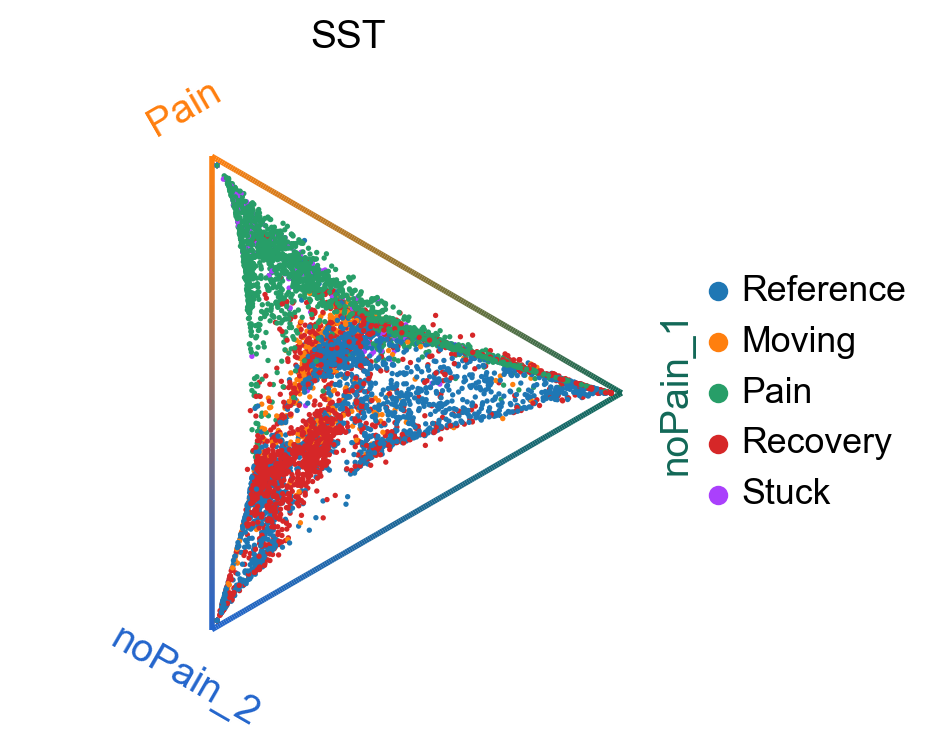

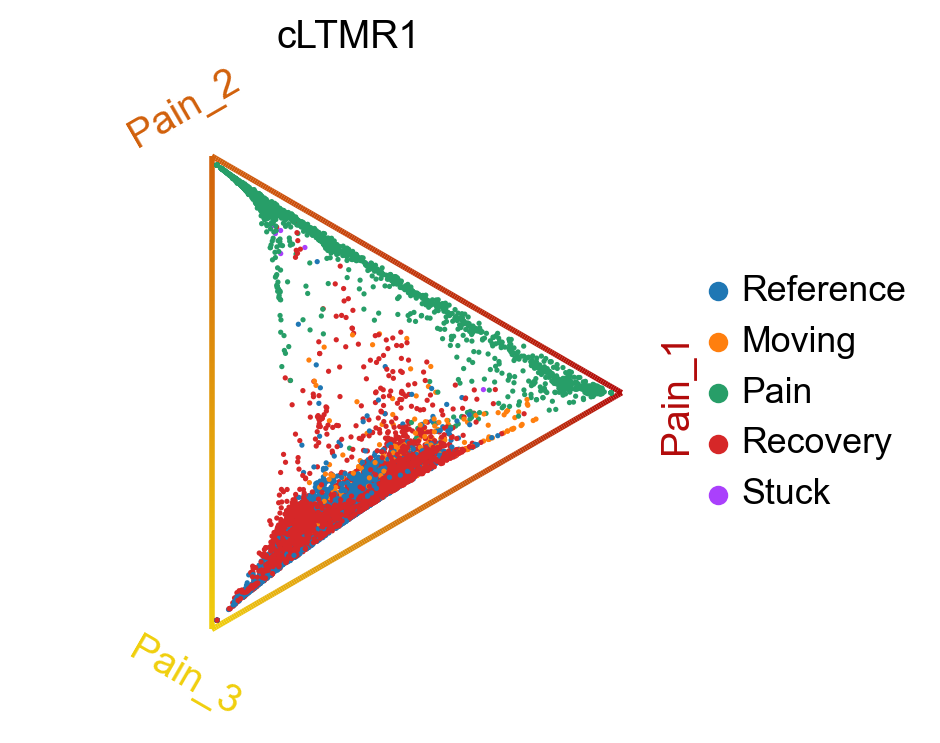

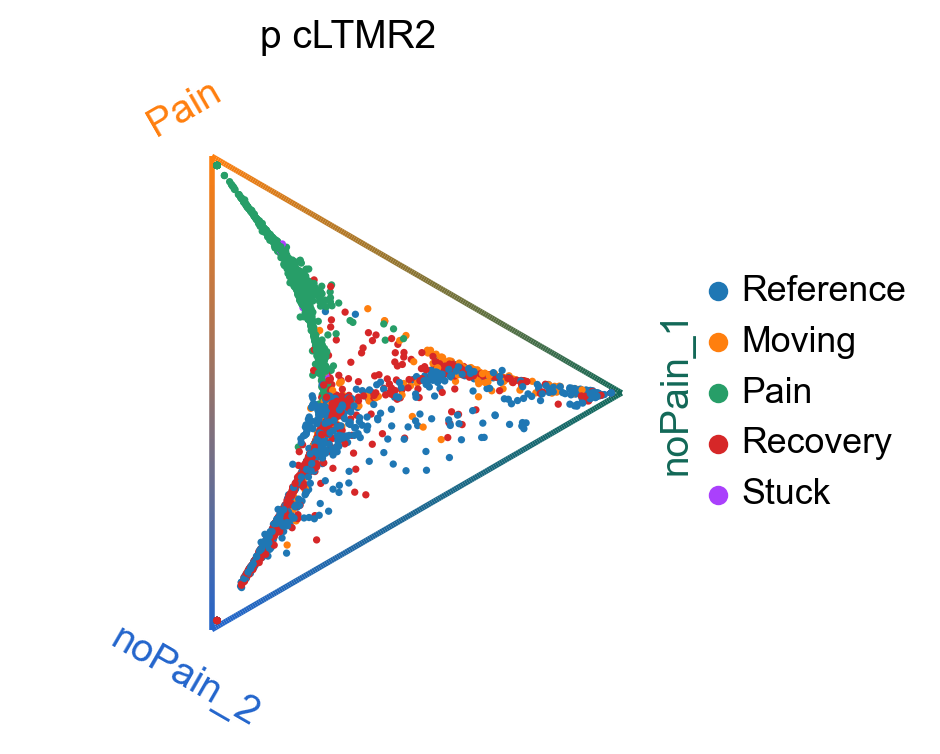

In [5]:
for key in ad_holder.keys():
    cr.pl.circular_projection(ad_holder[key]['adata'], keys="Pain_dynamics", legend_loc="right", title=key,
                              save=f'/Users/pax/Manu_fig/eps/circular_projection_{key}.eps')

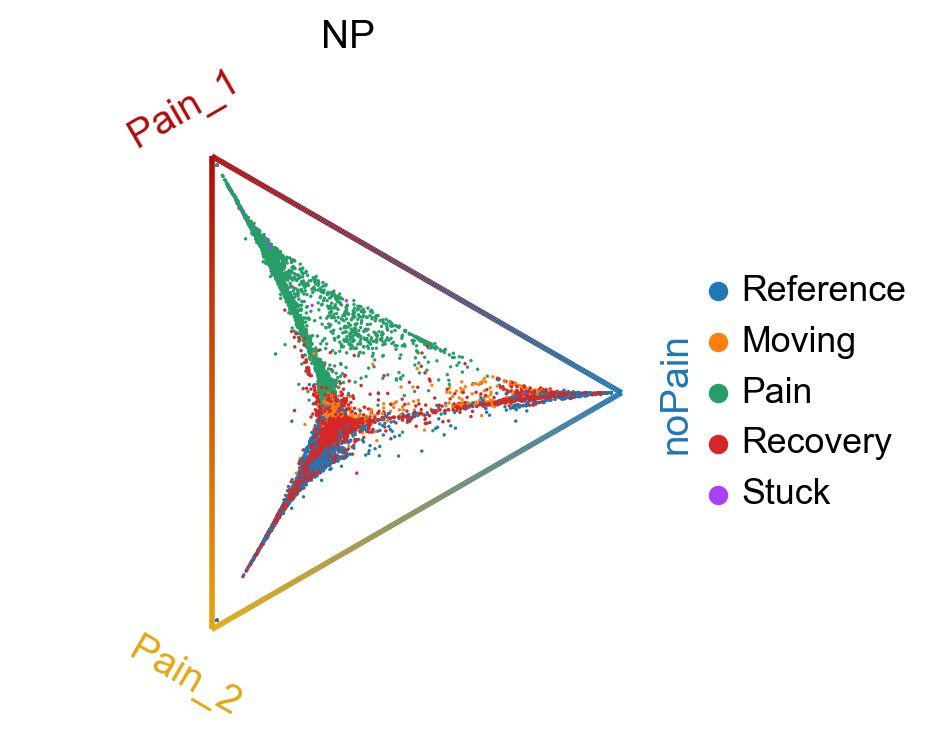

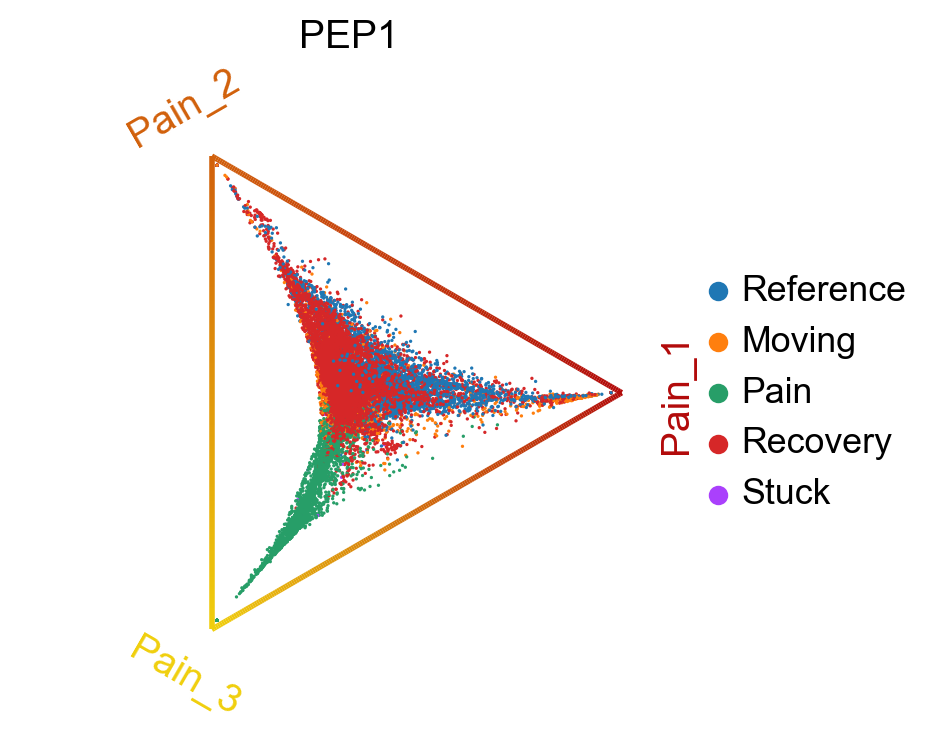

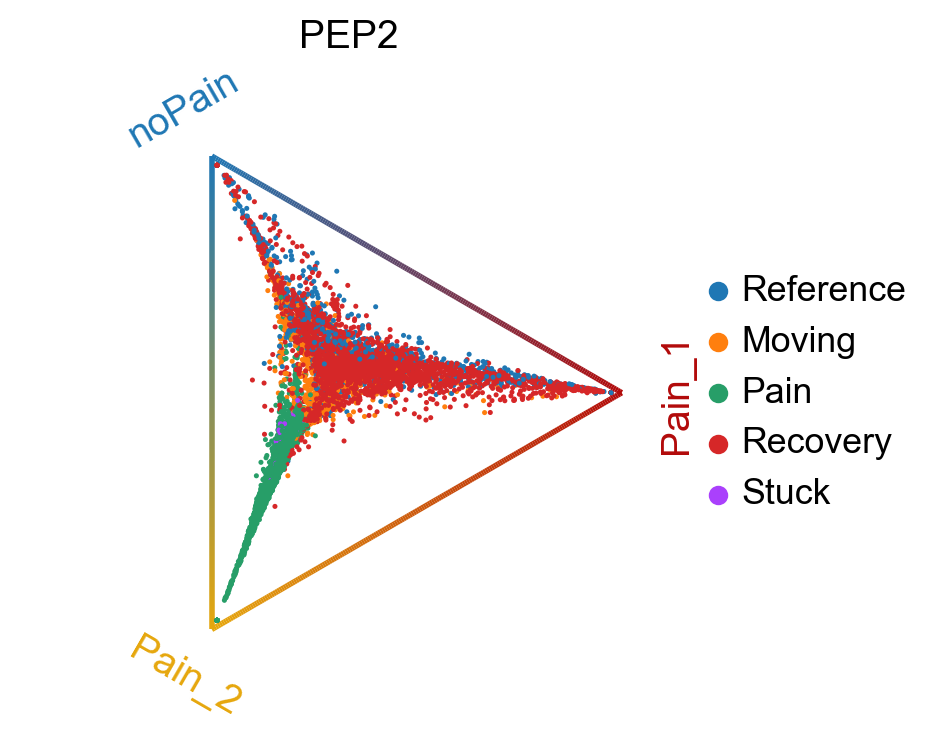

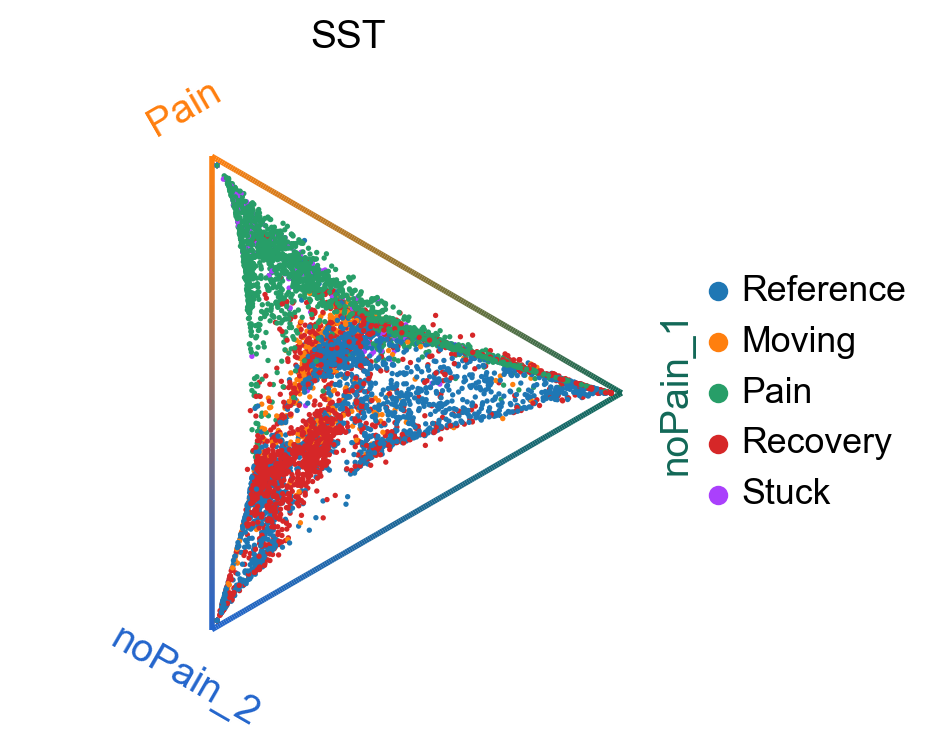

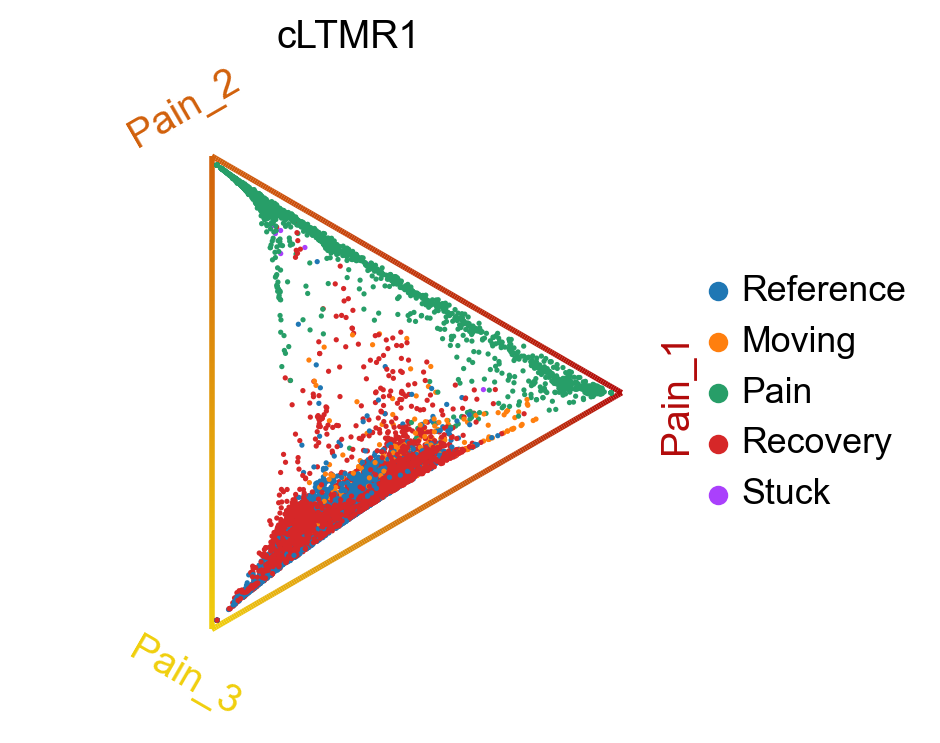

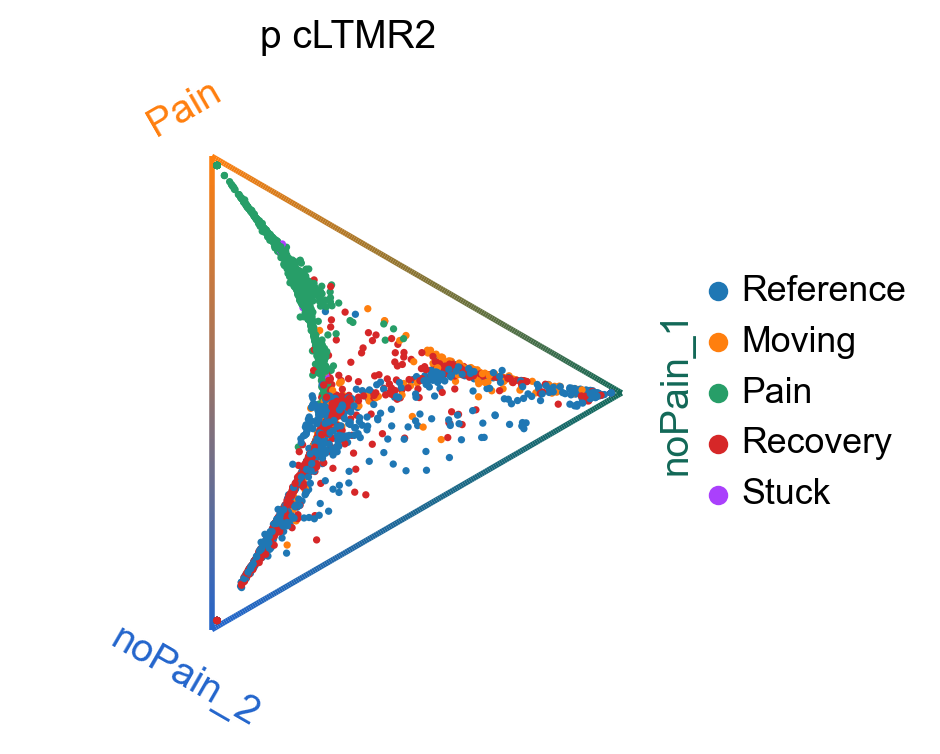

In [6]:
for key in ad_holder.keys():
    cr.pl.circular_projection(ad_holder[key]['adata'], keys="Pain_dynamics", legend_loc="right", title=key,
                              save=f'/Users/pax/Manu_fig/circular_projection_{key}.pdf')

In [21]:
ad_holder['PEP1']['drivers'] = ad_holder['PEP1']['GPCCA'].compute_lineage_drivers(lineages='Pain_3')

In [26]:
drivers = []
for sub in ad_holder.keys():
    driver = ad_holder[sub]['drivers'].copy()
    driver.columns = ['corr','pval','qval','ci_low','ci_high']
    driver = driver[driver['qval'] < 0.01]
    driver = driver[(driver['ci_low'] > 0) & (driver['ci_high'] > 0)]
    driver['subtype'] = sub
    drivers.append(driver)
driver_df = pd.concat(drivers)
driver_df['names'] = driver_df.index.astype(str)
driver_df.to_excel('./Results_xlsx/06_noci_all_early&Pain_drivers.xlsx')

In [25]:
for sub in ad_holder.keys():
    print(sub)
    ad_holder[sub]['GPCCA'].write(f'./Results_CellRank_early/06_noci_{sub}_early.h5ad')
    ad_holder[sub]['drivers'].to_excel(f'./Results_xlsx/06_noci_{sub}_early&Pain_drivers.xlsx')

NP
PEP1
PEP2
SST
cLTMR1
p_cLTMR2


In [7]:
ad_holder = {}
output_dir = "./Results_CellRank_early"
excel_dir = "./Results_xlsx"
for sub in ['NP', 'PEP1', 'PEP2', 'SST', 'cLTMR1', 'p_cLTMR2']:
    ad_holder[sub] = {}
    ad_holder[sub]['GPCCA'] = GPCCA.read(output_dir+f'/06_noci_{sub}_early.h5ad')
    ad_holder[sub]['adata'] = ad_holder[sub]['GPCCA'].adata
    ad_holder[sub]['drivers'] = pd.read_excel(excel_dir+f'/06_noci_{sub}_early&Pain_drivers.xlsx', index_col=0)
    if "Pain_1" in ad_holder[sub]['adata'].obs.term_states_fwd.unique():
        if sub == 'NP':
            lin = 'Pain_1'
        else:
            lin = 'Pain_2'
        ad_holder[sub]['gam'] = cr.models.GAMR(ad_holder[sub]['adata']).prepare(gene='Sox11', use_raw=False,
                                                                            time_key='ct_pseudotime', lineage=lin).fit()
    else:
        ad_holder[sub]['gam'] = cr.models.GAMR(ad_holder[sub]['adata']).prepare(gene='Sox11', use_raw=False,
                                                                            time_key='ct_pseudotime', lineage="Pain").fit()

In [87]:
top10 = driver_df.groupby('subtype').head(10)

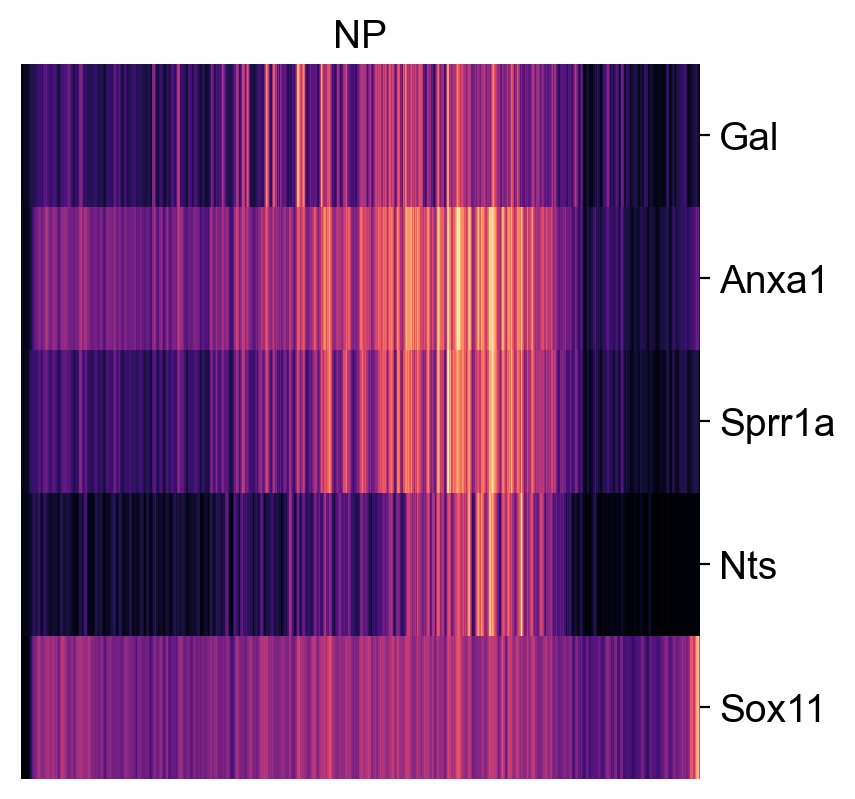

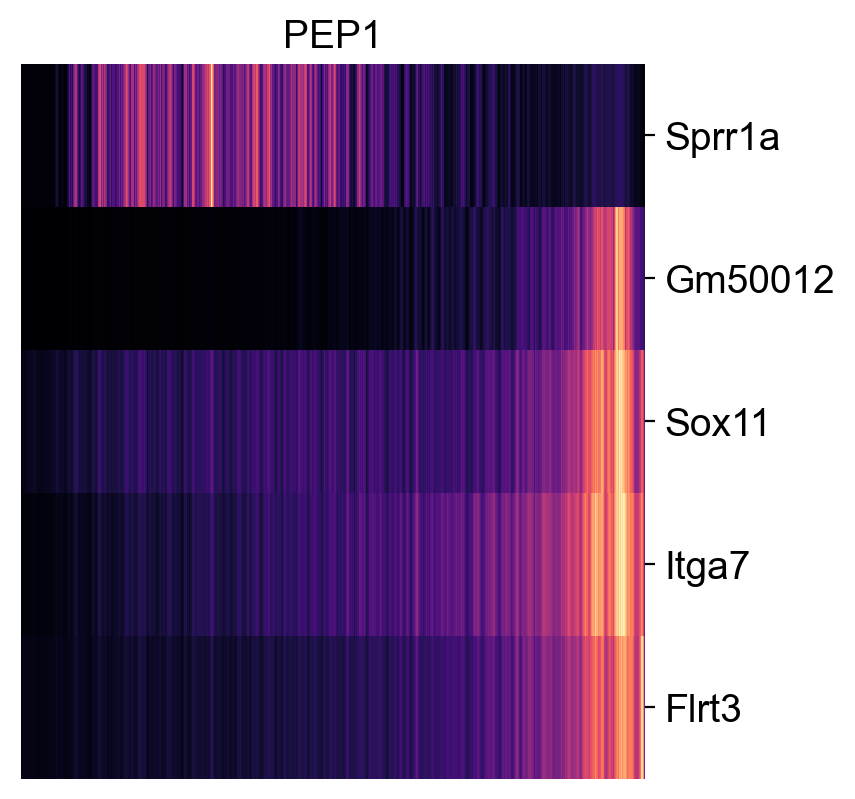

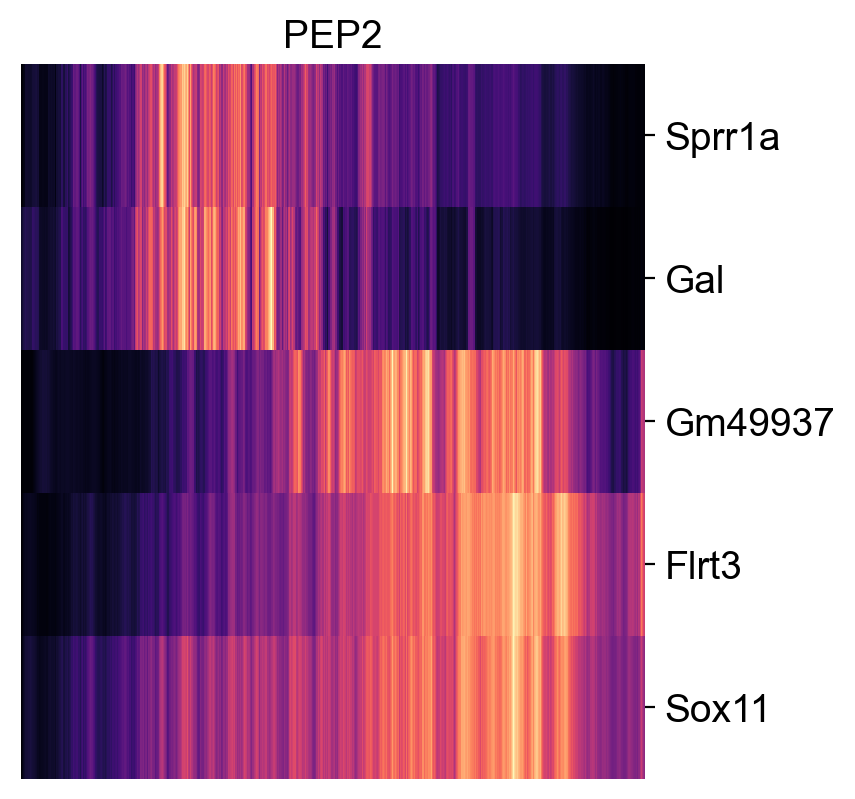

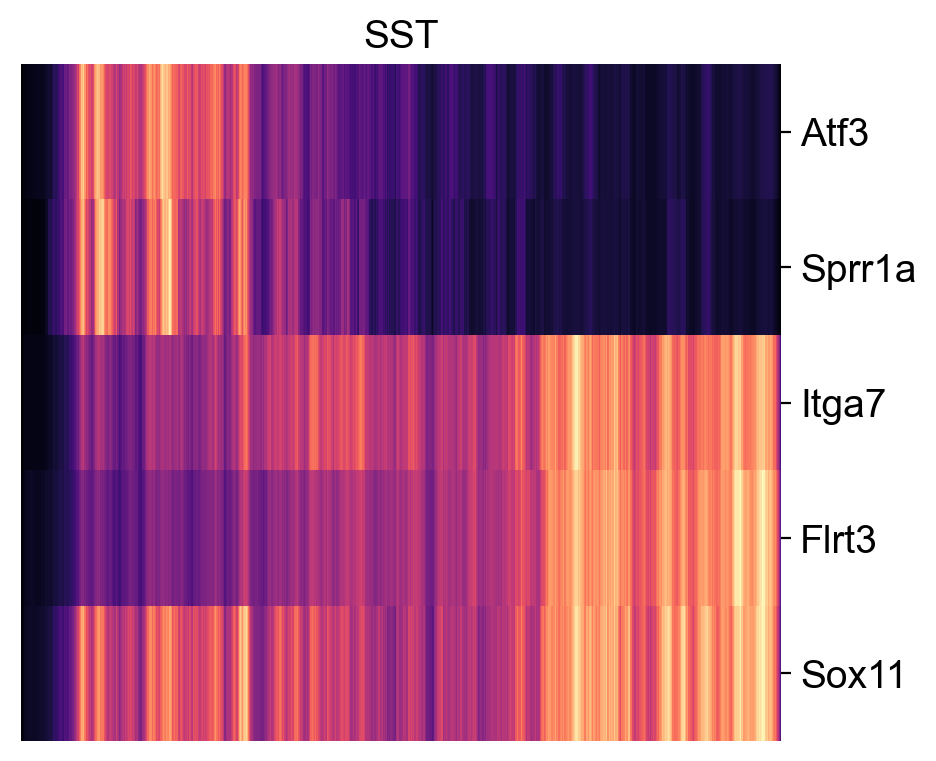

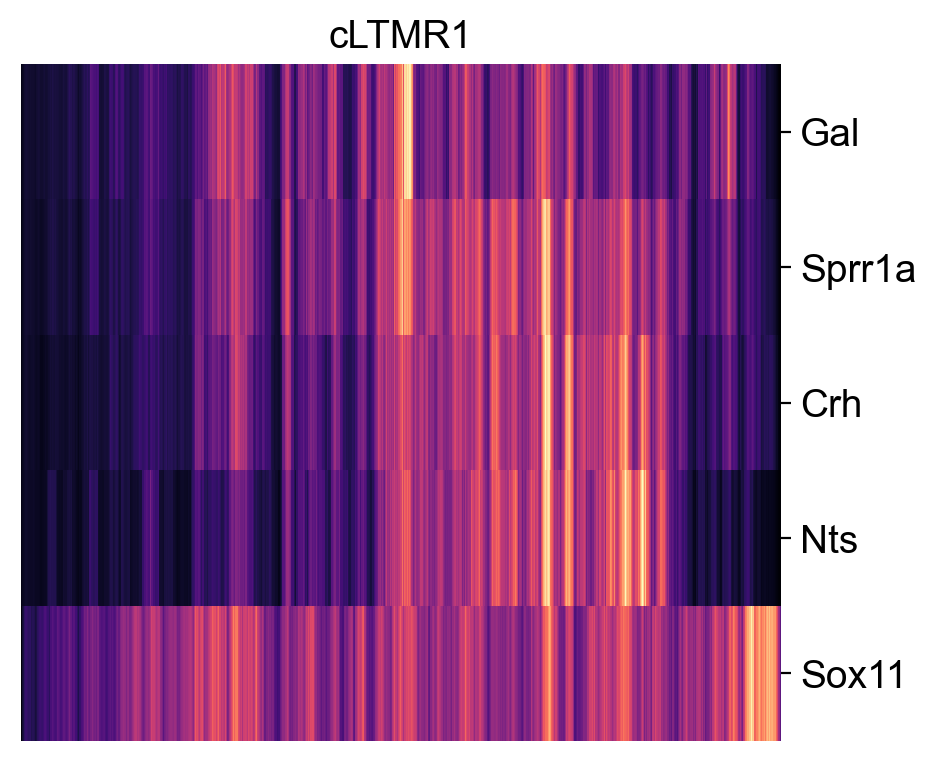

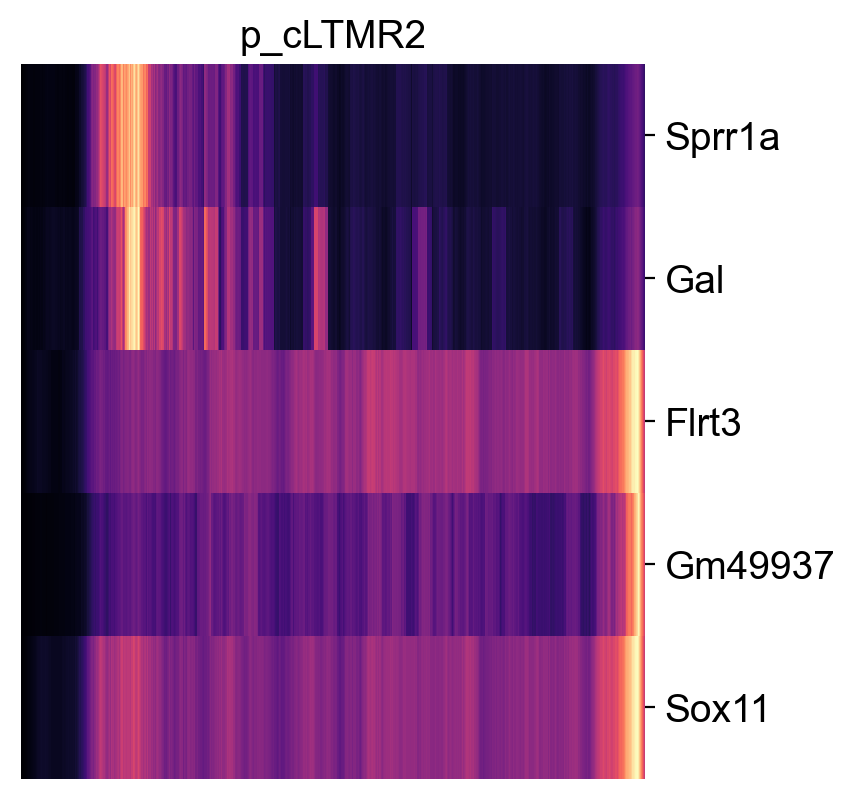

In [8]:
for sub in ['NP', 'PEP1', 'PEP2', 'SST', 'cLTMR1', 'p_cLTMR2']: 
    ax = scv.pl.heatmap(ad_holder[sub]['adata'], var_names=ad_holder[sub]['drivers'].head(5).index, show=False, yticklabels=True,
               sortby='ct_pseudotime', layer='scVI_gene', figsize=(4.5,4), n_convolve=100, sort=True, color_map='magma')
    ax.ax_heatmap.set_title(sub)
    ax.ax_heatmap.yaxis.set_tick_params(rotation=0)
    ax.ax_heatmap.grid(False)
    ax.savefig(f'/Users/pax/Manu_fig/eps/heatmap_{sub}_top5_drivers_early.eps')

In [2]:
noci_mdata = mu.read('./Results_h5ad/05_noci_mdata_subcluster_CCAT.h5mu')

In [3]:
noci_mdata = noci_mdata[~noci_mdata.obs.Time.isin(['60day','90day'])].copy()

In [4]:
noci_mdata['atac'].var['peaks'] = noci_mdata['atac'].var.index.astype(str)
noci_mdata['atac'].var.index = noci_mdata['atac'].var.index.str.split('-').str.join('\n-')

/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/Users/pax/miniconda3/envs/cellrank2/lib/python3.11/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colo

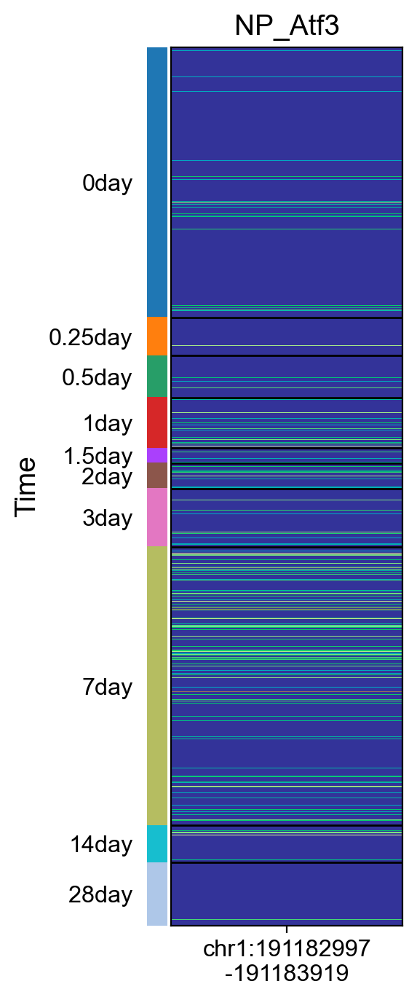

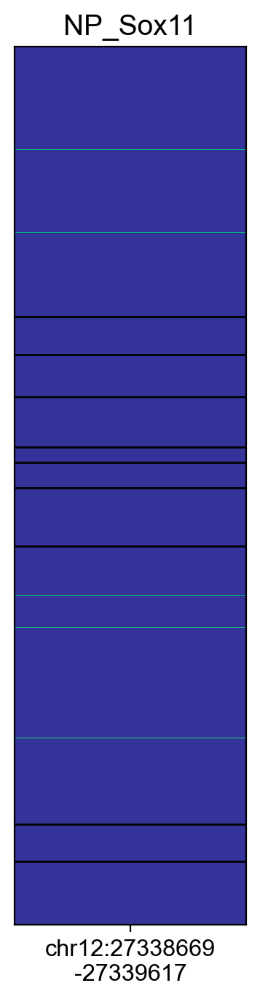

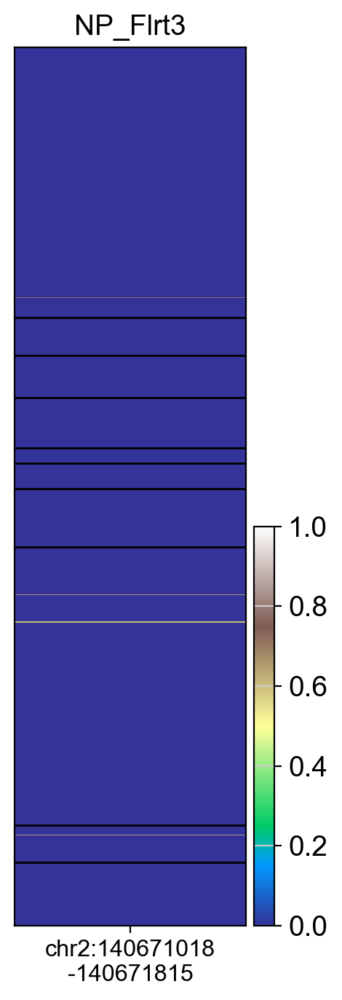

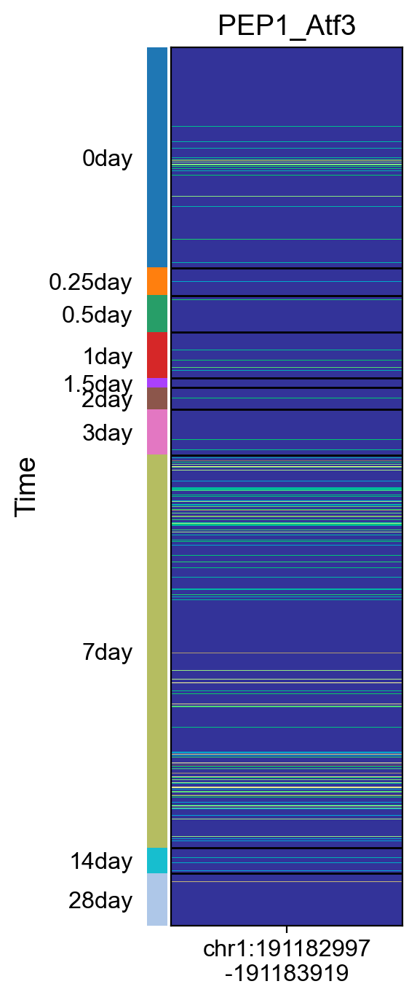

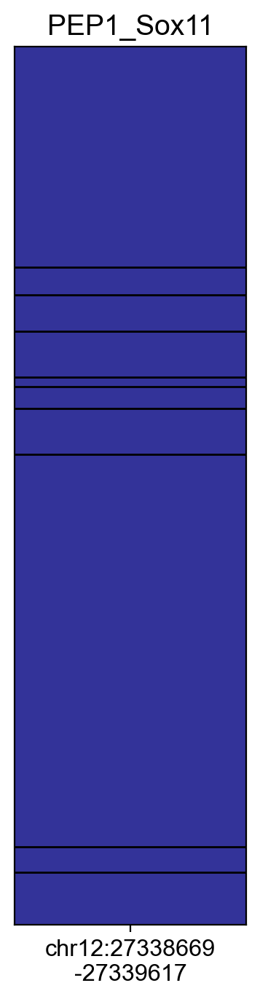

...

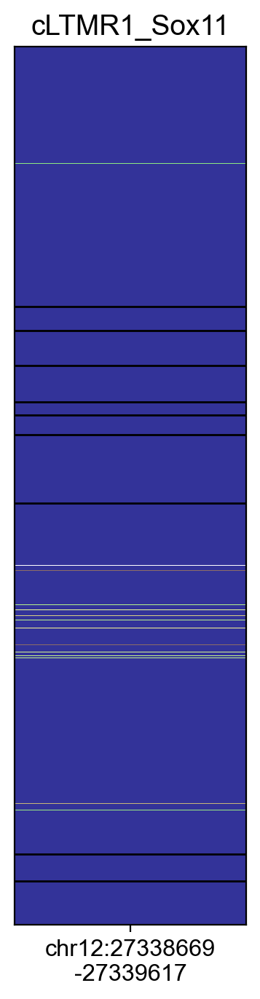

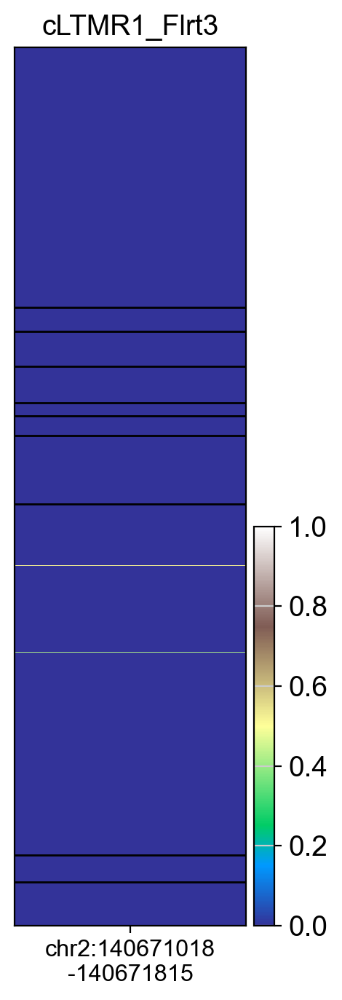

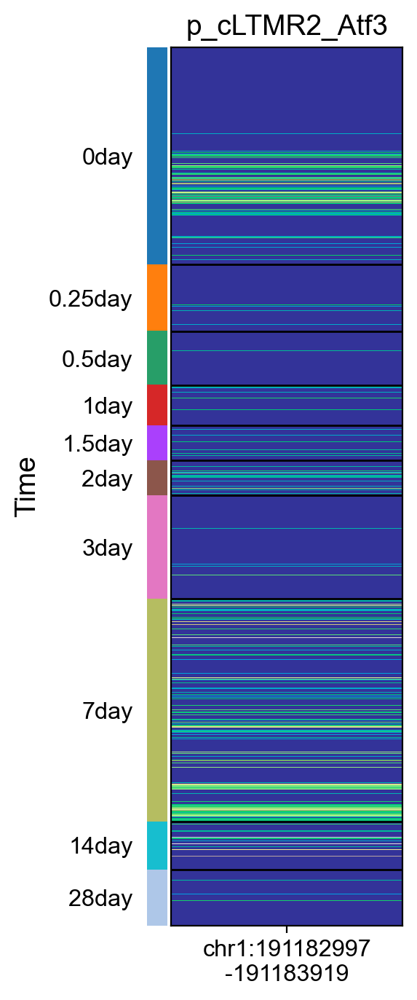

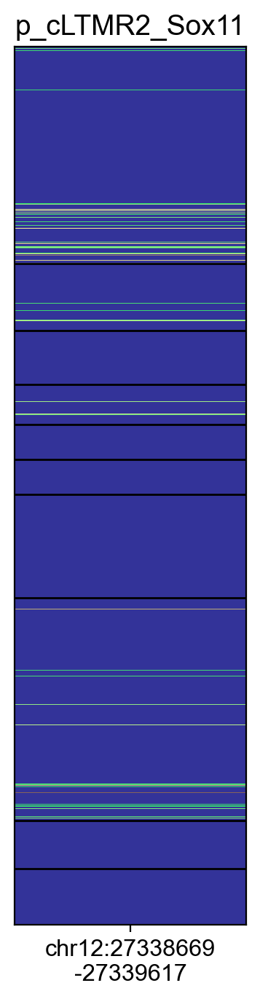

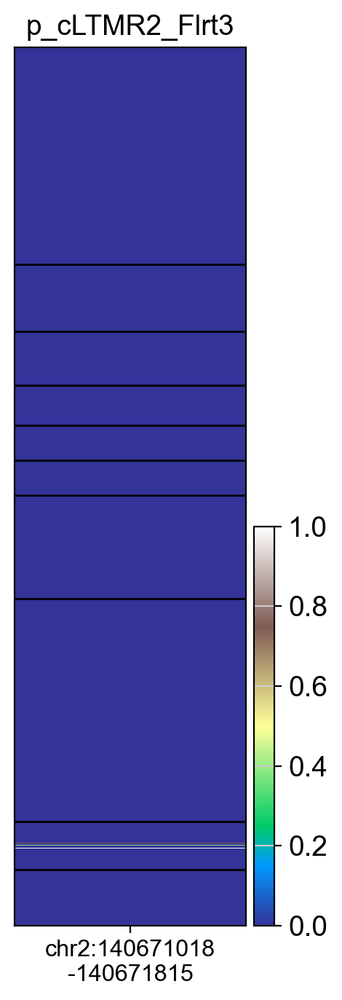

In [15]:
for sub in noci_mdata.obs.subtype.cat.categories:
    for idx,gene in enumerate(['Atf3','Sox11','Flrt3']):
        ax = sc.pl.heatmap(noci_mdata[noci_mdata.obs.subtype == sub]['atac'],
                      noci_mdata['atac'].var[(noci_mdata['atac'].var.gene_name == gene)].index,
                      'Time', figsize=(2.5,8), show=False,dendrogram=False, log=True,
                      standard_scale='var', cmap='terrain', layer='scVI_atac', swap_axes=False)
        ax['heatmap_ax'].set_title(f'{sub}_{gene}')
        ax['heatmap_ax'].xaxis.set_tick_params(rotation=0)
        if idx == 0:
            ax['heatmap_ax'].figure.axes[1].remove() # remove groupby legend
        elif idx == 1:
            ax['heatmap_ax'].figure.axes[-1].remove()
            ax['heatmap_ax'].figure.axes[-1].remove()
        else:
            ax['heatmap_ax'].figure.axes[-1].remove()
        # ax['heatmap_ax'].figure.savefig(f'/Users/pax/Manu_fig/atac_heatmap/{sub}_{gene}_terrain.svg', bbox_inches='tight')